In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append('..')

In [2]:
import scanpy as sc
from torch import optim
from tqdm import tqdm
import numpy as np
import seaborn as sns
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale
from scipy.stats import spearmanr
import squidpy as sq
import math
from anndata import AnnData
import pandas as pd
from sklearn.decomposition import PCA
import cuml
from matplotlib.colors import ListedColormap
from scipy.spatial import distance_matrix

In [3]:
import uniport as up
from utils import featurize, train_test_split
from plotting import plot_umap_grid, plot_latent
from spicess.modules.losses import Metrics, Loss
from early_stopping import EarlyStopping
from spicess.vae_infomax import InfoMaxVAE

In [4]:
import torch
assert torch.cuda.is_available()
torch.manual_seed(1)
torch.cuda.manual_seed(1)
np.random.seed(1)

In [5]:
hex_colors =  ["#4a3e38",
"#9fbfa2",
"#b99bbd",
"#53366c",
"#b2834b",
"#00612e",
"#00acef",
"#00eee9",
"#ba4850",
"#cac84d",
"#ce52ad",
"#76d05c",
"#794bc8",
"#e85a00"]

colors = ListedColormap(sns.color_palette(hex_colors))
# colors

In [6]:
antibody_panel = pd.read_csv('antibody_panel.csv')

In [7]:
tissue = 'Breast'
with open(f'{tissue}.txt', 'r') as f:
        genes = [g.strip() for g in f.readlines()]
    
adata = sc.read_10x_h5(f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX/filtered_feature_bc_matrix.h5', gex_only=False)
visium_ = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX/')
adata.uns['spatial'] = visium_.uns['spatial']
adata.obsm['spatial'] = visium_.obsm['spatial']
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
adata = adata[adata.obs["pct_counts_mt"] < 20]
adata = adata[:, adata.var["mt"] == False]
pdata = adata[:, adata.var.feature_types=='Antibody Capture']
adata = adata[:, adata.var.feature_types=='Gene Expression']
pdata.var["isotype_control"] = (pdata.var_names.str.startswith("mouse") | pdata.var_names.str.startswith("rat") | pdata.var_names.str.startswith("HLA"))
pdata = pdata[:, pdata.var.isotype_control==False]
adata.layers['counts'] = adata.X
pdata.layers['counts'] = pdata.X
adata.var_names_make_unique()
adata.shape, pdata.shape   

adata = adata[:, adata.var_names.isin(genes)]
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adata.obs['source'] = 'Breast CytAssist (Ref)'
adata.obs['domain_id'] = 0
adata.obs['source'] = adata.obs['source'].astype('category')
adata.obs['domain_id'] = adata.obs['domain_id'].astype('category')

In [8]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
up.batch_scale(adata)

In [9]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.leiden(adata)

In [10]:
adata_cyt = up.Run(name=tissue, adatas=[adata], adata_cm =adata, lambda_s=1.0, out='project', ref_id=1)
adata_cyt.obsm['latent'] = adata_cyt.obsm['project']

In [11]:
pdata.obsm['spatial'] = adata.obsm['spatial']
pdata.raw = pdata
adata.raw = adata
pdata.X = pdata.X.astype(float)

In [12]:
gex = featurize(adata)
pex = featurize(pdata, clr=True)

In [13]:
d11 = adata_cyt.obsm['latent']
d12 = pex.features.cpu().numpy()

In [14]:
d11.shape, d12.shape

((4169, 16), (4169, 30))

In [15]:
refLabels = adata_cyt.obs.leiden.values

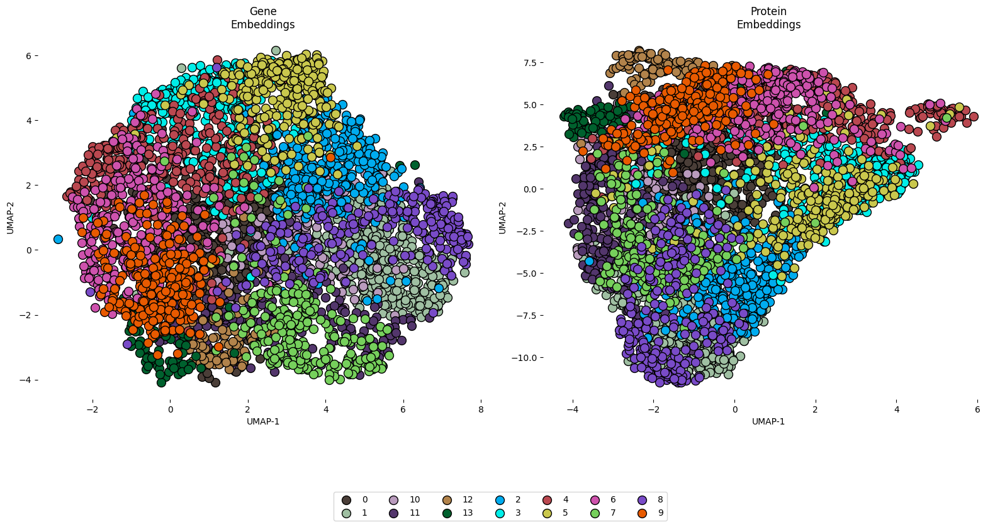

In [16]:
plot_latent([d11, d12], [refLabels, refLabels], separate_dim=True, legend=True, n_neighbors=100);

In [38]:
class Dojo:
    def __init__(self, gene_mtx, protein_mtx, adata, pdata):
        self.gene_mtx = gene_mtx
        self.protein_mtx = protein_mtx
        self.adata = adata
        self.pdata = pdata
        
        self.train_test_split(self.adata)
        
    def train_test_split(self, adata):
        adata.obs['idx'] = list(range(0, len(adata)))
        xy = adata.obsm['spatial']
        x = xy[:, 0]
        y = xy[:, 1]
        xmin, ymin = adata.obsm['spatial'].min(0)
        xmax, ymax = adata.obsm['spatial'].max(0)
        x_segments = np.linspace(xmin, xmax, 4)
        y_segments = np.linspace(ymin, ymax, 4)
        category = np.zeros_like(x, dtype=int)
        for i, (xi, yi) in enumerate(zip(x, y)):
            for j, (xmin_j, xmax_j) in enumerate(zip(x_segments[:-1], x_segments[1:])):
                if xmin_j <= xi <= xmax_j:
                    for k, (ymin_k, ymax_k) in enumerate(zip(y_segments[:-1], y_segments[1:])):
                        if ymin_k <= yi <= ymax_k:
                            category[i] = 3*k + j
                            break
                    break
        adata.obs['train_test'] = category
        adata.obs['train_test'] = adata.obs['train_test'].astype('category')
        
            
    def get_next_indices(self):
        for ix in self.adata.obs['train_test'].unique():
            mask = self.adata.obs['train_test'].isin([ix])
            train_idx = self.adata[~mask].obs.idx.values
            test_idx = self.adata[mask].obs.idx.values
            yield train_idx, test_idx
            
            
    def train_model(self, train_idx, test_idx, idx):
        
        d12t = self.protein_mtx[test_idx, :]
        d11t = self.gene_mtx[test_idx, :]
        d12 = self.protein_mtx[train_idx, :]
        d11 = self.gene_mtx[train_idx, :]

        d11 = torch.tensor(d11).cuda().float()
        d11t = torch.tensor(d11t).cuda().float()
        d12 = torch.tensor(d12).cuda().float()
        d12t = torch.tensor(d12t).cuda().float()
    
        model = InfoMaxVAE([d11.shape[1], d12.shape[1]], latent_dim=64).cuda()
        optimizer = optim.Adam(model.parameters(), lr=2e-3, weight_decay=0)
    
        es = EarlyStopping(patience=200, verbose=False, delta=0)
        metrics = Metrics(track=False)
        
        epochs = 10
        loss_func = Loss(max_epochs=epochs)
        loss_func.alpha = {
            'kl_gex': 1e-2,
            'kl_pex': 1e-2,
            'recons_gex': 1e-1,
            'recons_pex': 1e-2,
            'cosine_gex': 1e-3,
            'cosine_pex': 1e-3,
            'adj': 1e-6,
            'spatial': 1e-5,
            'mutual_gex': 1e-3,
            'mutual_pex': 1e-3    
        }
        
        params = {
            'lr': 2e-3,
            'wd': 0,
            'kl_gex': 1e-2,
            'kl_pex': 1e-2,
            'recons_gex': 1e-1,
            'recons_pex': 1e-2,
            'cosine_gex': 1e-3,
            'cosine_pex': 1e-3,
            'adj': 1e-6,
            'spatial': 1e-5,
            'mutual_gex': 1e-3,
            'mutual_pex': 1e-3,
            'latent_dim': 64,
        
        }
        
        
        losses = []

        feats = d11t[:, :].data.cpu().numpy()
        feats2 = d12t[:, :].data.cpu().numpy()

        A = gex.adj_norm.to_dense()[train_idx, :][:, train_idx]
        At = gex.adj_norm.to_dense()[test_idx, :][:, test_idx]
        
        with tqdm(total=epochs) as pbar:
            for e in range(epochs):
                model.train()
                optimizer.zero_grad()

                output = model(X=[d11, d12], A=A)            

                output.epochs = epochs
                output.adj_label = gex.adj_label[train_idx][:, train_idx]
                output.pos_weight = gex.pos_weight
                output.gex_sp_dist = gex.sp_dists[train_idx][:, train_idx]
                output.corr = gex.adj_label[train_idx][:, train_idx]
                output.norm = gex.norm

                buffer = loss_func.compute(e, output)
                loss = metrics(buffer).sum()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
                optimizer.step()
                losses.append(float(loss))


                model.eval()
                output = model(X=[d11t, d12t], A=At) 
                pex_recons = output.pex_recons.data.cpu().numpy()
                pex_cor_mean = np.mean([spearmanr(feats2[:, ixs], pex_recons[:, ixs]).statistic for ixs in range(pex_recons.shape[1])])
                metrics.update_value('pex_corr', pex_cor_mean)

                proteins = model.impute(d11t, At)
                oracle_corr = np.mean([spearmanr(feats2[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])
                metrics.update_value('oracle', oracle_corr, track=True)


                cosine_loss = 0.5*(metrics.means.cosine_loss_gex + metrics.means.cosine_loss_pex)

                es(1-oracle_corr, model)
                if es.early_stop: 
                    model = es.best_model
                    break


                pbar.update()        
                pbar.set_description(f'{idx+1}/{9} | Oracle: {metrics.means.oracle:.3f} | PEX: {np.mean(metrics.means.pex_corr):.3f} | Cosine: {cosine_loss:.3g} ')  
        
        model.eval()
        proteins = model.impute(d11t, At)        
        
        return proteins

     
    def run(self):
        stacked_imputations = []
        tests = []
        for idx, (train_idx, test_idx) in enumerate(self.get_next_indices()):
            p = self.train_model(train_idx, test_idx, idx)
            stacked_imputations.append(p)
            tests.append(test_idx)
            
        tests = np.concatenate(tests)
        imps = np.concatenate(stacked_imputations)
        p = sorted(zip(tests, imps))        
        return np.mean([spearmanr(d12[:, ixs], p[:, ixs]).statistic for ixs in range(p.shape[1])])

In [39]:
params = {}

In [40]:
dojo = Dojo(gene_mtx=d11, protein_mtx=d12, adata=adata, pdata=pdata)

In [41]:
p = dojo.run()

1/9 | Oracle: -0.017 | PEX: -0.029 | Cosine: 0.000553 : 100%|██████████| 10/10 [00:01<00:00,  8.41it/s]
2/9 | Oracle: -0.036 | PEX: 0.004 | Cosine: 0.000559 : 100%|██████████| 10/10 [00:00<00:00, 10.58it/s]
3/9 | Oracle: -0.076 | PEX: -0.070 | Cosine: 0.000571 : 100%|██████████| 10/10 [00:00<00:00, 10.45it/s]
4/9 | Oracle: 0.077 | PEX: 0.064 | Cosine: 0.000555 : 100%|██████████| 10/10 [00:00<00:00, 13.49it/s]
5/9 | Oracle: -0.064 | PEX: -0.056 | Cosine: 0.000568 : 100%|██████████| 10/10 [00:00<00:00, 13.34it/s]
6/9 | Oracle: -0.025 | PEX: -0.013 | Cosine: 0.000553 : 100%|██████████| 10/10 [00:00<00:00, 13.74it/s]
7/9 | Oracle: 0.008 | PEX: -0.003 | Cosine: 0.000556 : 100%|██████████| 10/10 [00:00<00:00, 14.15it/s]
8/9 | Oracle: 0.009 | PEX: 0.063 | Cosine: 0.000559 : 100%|██████████| 10/10 [00:00<00:00, 13.76it/s]
9/9 | Oracle: 0.043 | PEX: 0.037 | Cosine: 0.000563 : 100%|██████████| 10/10 [00:00<00:00, 11.92it/s]


In [42]:
imp, tests = p

In [54]:
p = sorted(zip(tests, imp))

In [62]:
np.concatenate([i[1] for i in p], 0)

array([0.16050062, 0.14487626, 0.11330941, ..., 0.2135826 , 0.0769086 ,
       0.0345173 ], dtype=float32)

In [66]:
.shape

(4169, 30)

In [46]:
# np.random.shuffle(d11)
# np.random.shuffle(d11t)

In [55]:
model = InfoMaxVAE([d11.shape[1], d12.shape[1]], latent_dim=64, encoder_dim=64).cuda()
es = EarlyStopping(patience=100, verbose=False, delta=0)
optimizer = optim.Adam(model.parameters(), lr=2e-3, weight_decay=0)
epochs = 250
loss_func = Loss(max_epochs=epochs)
metrics = Metrics(track=False)
loss_func.alpha = {
    'kl_gex': 1e-2,
    'kl_pex': 1e-2,
    'recons_gex': 1e-1,
    'recons_pex': 1e-2,
    'cosine_gex': 1e-3,
    'cosine_pex': 1e-3,
    'adj': 1e-6,
    'spatial': 1e-5,
    'mutual_gex': 1e-3,
    'mutual_pex': 1e-3    
}

In [56]:
losses = []
embeds = []
feats = d11t[:, :].data.cpu().numpy()
feats2 = d12t[:, :].data.cpu().numpy()
dist = []


A = gex.adj_norm.to_dense()[train_idx][:, train_idx]
# A = corr
# np.random.shuffle(A)

try:
    with tqdm(total=epochs) as pbar:
        for e in range(epochs):

            model.train()
            optimizer.zero_grad()

            output = model(X=[d11, d12], A=A)            
            
            output.epochs = epochs
            output.adj_label = gex.adj_label[train_idx][:, train_idx]
            output.pos_weight = gex.pos_weight
            output.gex_sp_dist = gex.sp_dists[train_idx][:, train_idx]
            output.corr = gex.adj_label[train_idx][:, train_idx]
            output.norm = gex.norm

            buffer = loss_func.compute(e, output)
            loss = metrics(buffer).sum()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
            optimizer.step()
            losses.append(float(loss))


            model.eval()
            At = gex.adj_norm.to_dense()[test_idx][:, test_idx]
            output = model(X=[d11t, d12t], A=At) 
            pex_recons = output.pex_recons.data.cpu().numpy()
            pex_cor_mean = np.mean([spearmanr(feats2[:, ixs], pex_recons[:, ixs]).statistic for ixs in range(pex_recons.shape[1])])
            metrics.update_value('pex_corr', pex_cor_mean)

            proteins = model.impute(d11t, At)
            oracle_corr = np.mean([spearmanr(feats2[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])
            metrics.update_value('oracle', oracle_corr, track=True)

            # integrated_data =  model(X=[d11, d12], A=A)
            # gex_z = integrated_data.gex_z.data.cpu().numpy()[:50, :]
            # pex_z = integrated_data.pex_z.data.cpu().numpy()[:50, :]
            # a, b = plot_latent([gex_z, pex_z], [type1[:50], type2[:50]], reduce_only=True);
            # dist = np.mean([euclidean_distance(ai, bi) for ai, bi in zip(a, b)])
            # metrics.update_value('dist', dist)  

            cosine_loss = 0.5*(metrics.means.cosine_loss_gex + metrics.means.cosine_loss_pex)
            
            es(1-oracle_corr, model)
            # if es.early_stop: 
            #     model = es.best_model
            #     break

            pbar.update()        
            pbar.set_description(f'Oracle: {metrics.means.oracle:.3f} | PEX: {np.mean(metrics.means.pex_corr):.3f} | Cosine: {cosine_loss:.3g} ')  
            
except Exception as e:
    raise e
    print('[!] Interrupted')   

Oracle: 0.493 | PEX: 0.559 | Cosine: 0.000842 : 100%|██████████| 250/250 [00:29<00:00,  8.57it/s] 


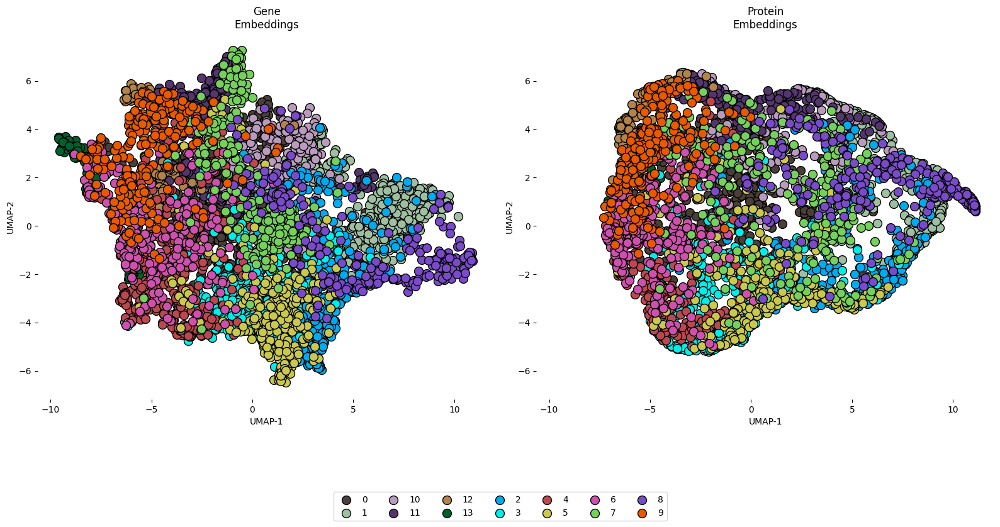

In [57]:
model = es.best_model
model.eval()
integrated_data =  model(X=[d11, d12], A=A)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

a, b = plot_latent([gex_z, pex_z], [type1[train_idx], type2[train_idx]], 
    legend=True, method='umap',
    separate_dim=False, n_neighbors=300,
    # save='./figures/aligned.svg'
);

In [58]:
torch.save(model.state_dict(), f'{tissue}_model.pth')

In [59]:
hues = d12.detach().cpu().numpy()
proteins = model.impute(d11, A)

In [60]:
from plotting import plot_umap_grid, plot_norm, plot_recons

In [61]:
# plot_umap_grid(a, hues, pdata.var_names, type1)

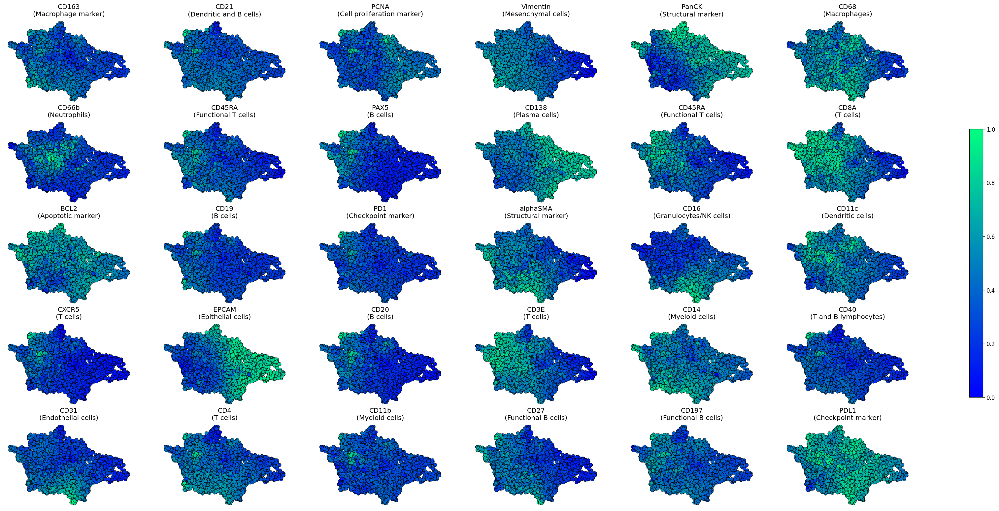

In [62]:
plot_umap_grid(a, proteins, pdata.var_names, type1)

In [63]:
proteins = model.impute(d11, A)
oracle_corr = np.mean([spearmanr(d12.detach().cpu().numpy()[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])

In [64]:
pex_recons = output.pex_recons.data.cpu().numpy()

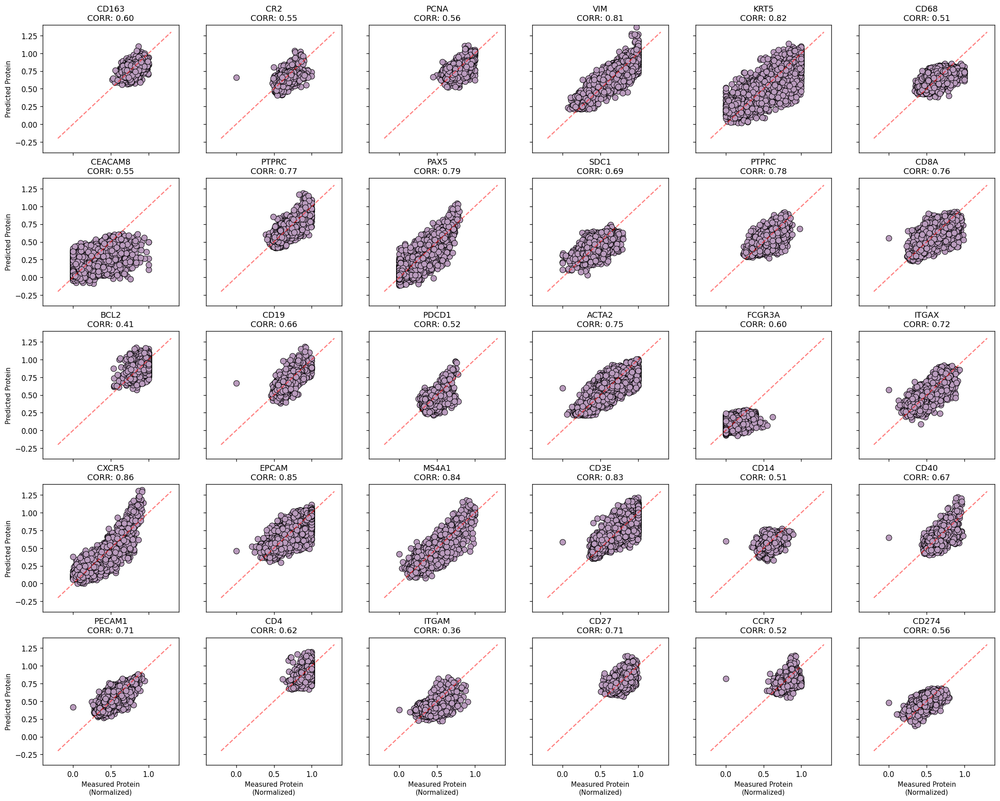

In [65]:
real = d12.detach().cpu().numpy()
f, axs = plt.subplots(5, 6, figsize=(23, 18), dpi=120, sharex=True, sharey=True)
axs = axs.flatten()
for ix, ax in enumerate(axs):
    # sns.scatterplot(x=real[:, ix], y=pex_recons[:, ix], ax=ax)
    ax.plot([-0.2, 1.3], [-0.2, 1.3], color='red', alpha=0.5, linestyle='--')
    
    sns.scatterplot(x=real[:, ix], y=proteins[:, ix], ax=ax, edgecolor='black', s=60, color=hex_colors[2])
    
    ax.set_xlim(-0.4, 1.4)
    ax.set_ylim(-0.4, 1.4)
    
    ax.set_title(f'{pdata.var_names[ix]}\nCORR: {spearmanr(real[:, ix], proteins[:, ix]).statistic:.2f}', fontsize=11)
    ax.set_xlabel('Measured Protein\n(Normalized)', fontsize=9)
    ax.set_ylabel('Predicted Protein', fontsize=9)
    
    
plt.show()

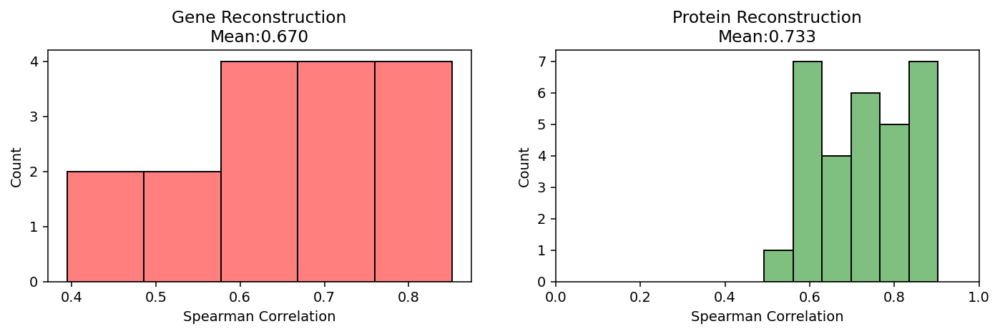

In [66]:
model = es.best_model
model.eval()
integrated_data =  model(X=[d11, d12], A=A)

plot_recons(integrated_data)

In [137]:
from captum.attr import IntegratedGradients, DeepLift, GradientShap, NoiseTunnel, FeatureAblation

In [133]:
model.cuda();

In [160]:
class Imputer(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.model.eval()
    
    def forward(self, x, adj):
        edge_index = adj.nonzero().t().contiguous()
        pos_z, neg_z, summary = self.model.encoders[0](x, edge_index)
        z = self.model.fc_mus[0](pos_z, adj)
        decoded = self.model.decoders[1](z)
        return decoded

In [161]:
imputer = Imputer(model)

In [185]:
d11.shape

torch.Size([4169, 16])

In [170]:
ig = FeatureAblation(imputer)

In [172]:
fa = ig.attribute((d11, A))

In [182]:
fa_sum = fa[0].detach().cpu().numpy().sum(0)
fa_norm_sum = fa_sum / np.linalg.norm(fa_sum, ord=1)

<AxesSubplot: >

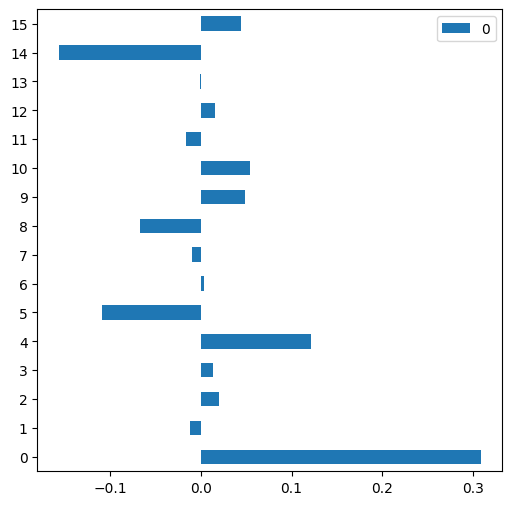

In [189]:
pd.DataFrame(fa_norm_sum).plot(kind='barh')

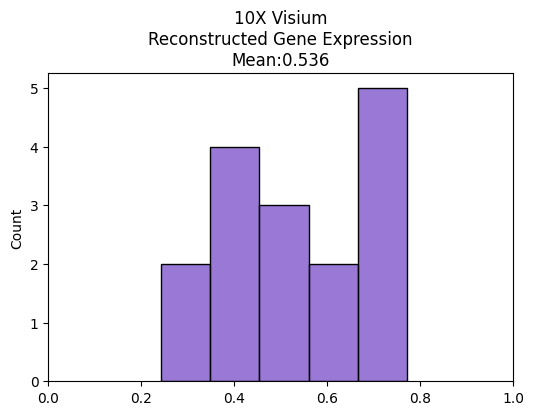

In [167]:
plt.rcParams['figure.figsize'] = [6, 4]

edge_index = gex2.adj_norm.to_dense().nonzero().t().contiguous()
gex2_z = model.fc_mus[0](model.encoders[0](d14, edge_index)[0], gex2.adj_norm.to_dense())
reconstructed_gex2 = model.decoders[0](gex2_z).detach().cpu().numpy()
gex2_z = gex2_z.detach().cpu().numpy()

b = d14.data.cpu().numpy()
corrs = []
for ixs in range(b.shape[1]):
    corrs.append(spearmanr(b[:, ixs], reconstructed_gex2[:, ixs]).statistic)  
sns.histplot(corrs, color=hex_colors[-2], label='TrainedModel')
plt.title(f'10X Visium\nReconstructed Gene Expression\nMean:{np.mean(corrs):.3f}')
plt.xlim(0, 1)
plt.show()

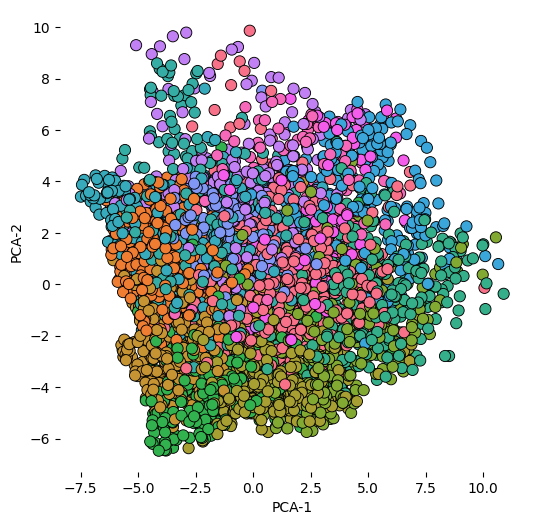

In [67]:
edge_index = A.nonzero().t().contiguous()
encoded, neg_z, summary = model.encoders[0](d11, edge_index)
encoded = encoded.detach().cpu().numpy()
plot_norm(encoded, labels=type1)

In [169]:
# model.eval()
# edge_index = At.nonzero().t().contiguous()
# encoded, neg_z, summary = model.encoders[0](d11t, edge_index)
# encoded = encoded.detach().cpu().numpy()
# z = np.random.multivariate_normal([0]*2, np.eye(2), len(type1[test_idx]))
# xy = PCA(2).fit_transform(encoded)
# plt.rcParams['figure.figsize'] = [6, 6]

# sns.scatterplot(x=z[:, 0], y=z[:, 1], color='grey', alpha=0.2, s=70)
# sns.scatterplot(x=xy[:, 0], y=xy[:, 1], hue=type1[test_idx], edgecolor='black', s=65, legend=False)
# sns.despine(left=True, bottom=True, trim=True, offset=10)
# plt.xlabel('PCA-1')
# plt.ylabel('PCA-2')
# plt.show()

In [170]:
# model.eval()
# integrated_data =  model(X=[d11t, d12t], A=At)
# gex_z = integrated_data.gex_z.data.cpu().numpy()
# pex_z = integrated_data.pex_z.data.cpu().numpy()

# a, b = plot_latent([gex_z, pex_z], [type1[test_idx], type2[test_idx]], 
#     legend=True, method='umap',
#     separate_dim=False, n_neighbors=200, size=300,
# );

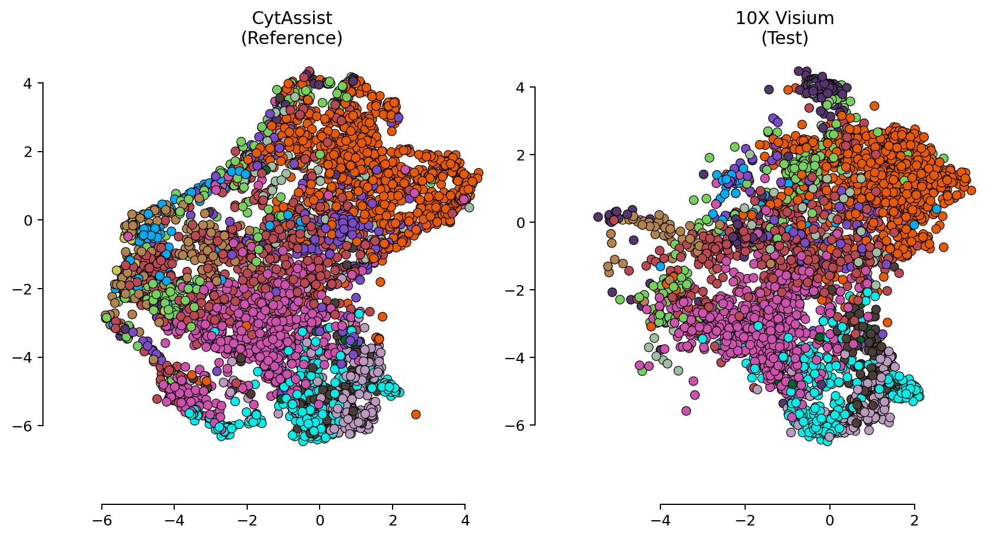

In [171]:
from sklearn.neighbors import KNeighborsClassifier

# adata2.obs['celltype'] = labels_10x
d14 = torch.tensor(adatax[adatax.obs.domain_id=='1'].obsm['latent']).cuda().float()
A14 = gex2.adj_norm.to_dense().float()

A = gex.adj_norm.to_dense()
data = adatax[adatax.obs.domain_id=='0']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A).detach().cpu().numpy()


data = adatax[adatax.obs.domain_id=='1']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A14.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
zx = model.fc_mus[0](pos_z, A14).detach().cpu().numpy()

f, axs = plt.subplots(1, 2, figsize=(11, 5), dpi=180)

A = gex.adj_norm.to_dense()
data = adatax[adatax.obs.domain_id=='0']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A).detach().cpu().numpy()

X_train = z
y_train = labels_cyt
knn = knn = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train)

red = cuml.UMAP(
        n_components=2,
        n_neighbors=100,
        min_dist=0.1,
        random_state=42
    )

red.fit(z);

plot_data = red.transform(z)
scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=labels_cyt, ax=axs[0], 
                          edgecolor='black', palette=dict(zip(type1.categories, hex_colors)), color='grey', legend=False)
ax = axs[0]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('CytAssist\n(Reference)')


data = adatax[adatax.obs.domain_id=='1']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A14.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A14).detach().cpu().numpy()

test_labels = knn.predict(z)

plot_data = red.transform(z)
scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=test_labels, ax=axs[1], 
                          edgecolor='black', palette=dict(zip(type1.categories, hex_colors)), color='grey', legend=False)
ax = axs[1]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('10X Visium\n(Test)')

# # plt.savefig('./figures/deconvolution_5.svg', format='svg', dpi=180)
plt.show()

In [172]:
adata2.uns['spatial'] = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX').uns['spatial']

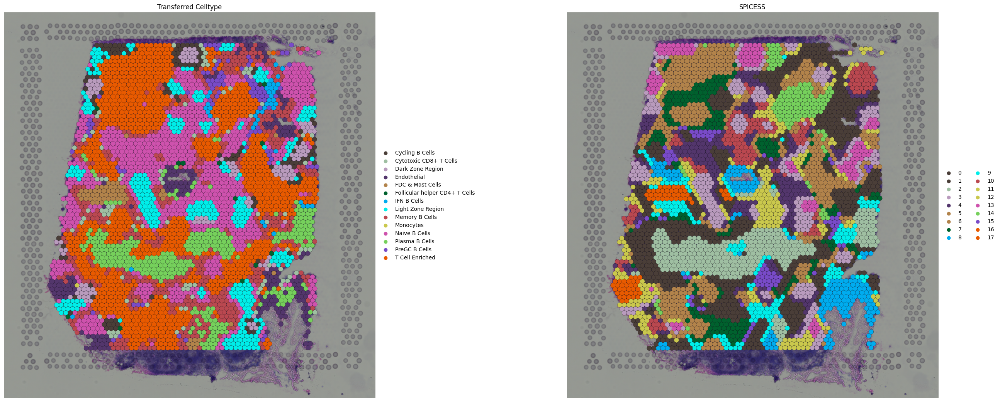

In [173]:
adata2.obs['celltype'] = test_labels
adata2.obs['celltype'] = adata2.obs['celltype'].astype('category')
# adata2.obs['celltype_extra'] = adata_10x.obs['celltype'].values.astype('category')

protein_preds = model.impute(dx, A14)
latent_gex = AnnData(protein_preds)
latent_gex.obsm['spatial'] = adata2.obsm['spatial']
latent_gex.uns['spatial'] = adata2.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)

resolution = 0.75
size = 1.65
linewidth = 0.2
img = True
alpha = 0.75

sc.tl.leiden(latent_gex, resolution=resolution)

adata2.obs['gex_z'] = latent_gex.obs.leiden.values

sq.pl.spatial_scatter(adata2, color=['celltype', 'gex_z'], size=size, title=['Transferred Celltype', 'SPICESS'],
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, img=img, shape='circle', palette=colors,
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(15, 13), 
                      dpi=100)

# plt.savefig('./figures/transferred.svg', format='svg', dpi=180)
plt.show()

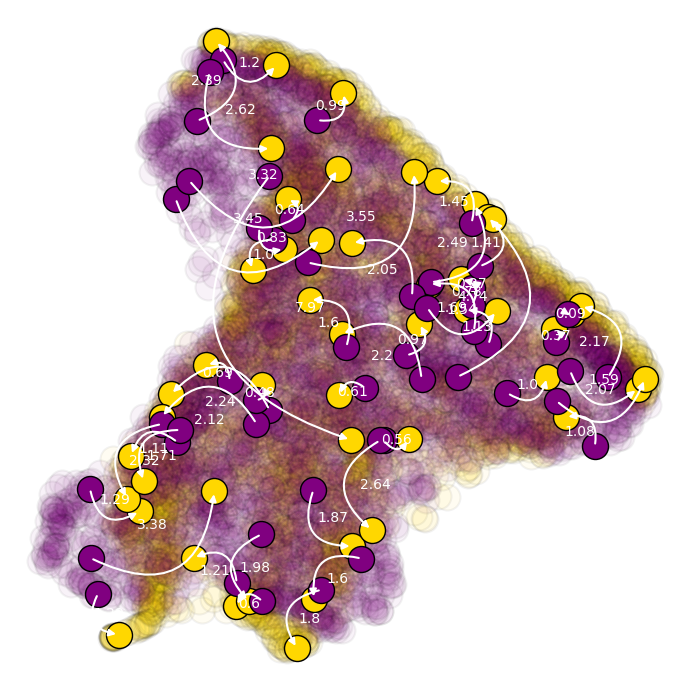

In [123]:
a, b = plot_latent([gex_z, pex_z], [type1[train_idx], type2[train_idx]], 
    legend=True, method='umap',
    separate_dim=False, n_neighbors=300, reduce_only=True);

plt.rcParams['figure.figsize'] = [7, 7]

c1 = 'purple'
c2 = 'gold'

a_ = a[:50]
b_ = b[:50]
d = [euclidean_distance(ai, bi) for ai, bi in zip(a_, b_)]


size = 350
marker = 'o'

sns.scatterplot(b[:, 0], b[:, 1], color=c2, s=size, alpha=0.05, edgecolor='black', linewidth=1.5, legend=False)
sns.scatterplot(a[:, 0], a[:, 1], color=c1, s=size, alpha=0.05, edgecolor='black', linewidth=1.5, legend=False)

sns.scatterplot(b_[:, 0], b_[:, 1], label='Proteins', color=c2, s=size, alpha=1, edgecolor='black', linewidth=1, marker=marker, legend=False)
sns.scatterplot(a_[:, 0], a_[:, 1], label='Genes', color=c1, s=size, alpha=1, edgecolor='black', linewidth=1, marker=marker, legend=False)


matches = list(zip(range(len(a_)), range(len(b_))))
x1 = a_[:, 0]
y1 = a_[:, 1]
x2 = b_[:, 0]
y2 = b_[:, 1]

for i, j in matches:    
    plt.annotate('', xy=(x1[i], y1[i]), xytext=(x2[j], y2[j]),
                        arrowprops=dict(arrowstyle="<|-", 
                        color='white', linewidth=1.5,
                        connectionstyle="arc3, rad=-0.7",
                        fc="w"))
    
    plt.annotate(str(round(d[i], 2)), xy=(0.5*(x1[i]+x2[i]), 0.5*(y1[i]+y2[i])), 
                 color='white', ha='center', va='center', size=10)

plt.box(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
# plt.savefig('figures/example_alignment.svg', format='svg', dpi=180)
plt.show()

In [ ]:
%%time

adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'
adata.obs['celltype'] = adata_ref.obs['celltype']

latent_gex = AnnData(gex_z)
latent_gex.obsm['spatial'] = adata.obsm['spatial']
latent_gex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)


latent_pex = AnnData(pex_z)
latent_pex.obsm['spatial'] = adata.obsm['spatial']
latent_pex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_pex)
sc.pp.neighbors(latent_pex)


pdata.obsm['spatial'] = adata.obsm['spatial']
sc.tl.pca(adata)
sc.pp.neighbors(adata)

sc.tl.pca(pdata)
sc.pp.neighbors(pdata)

CPU times: user 37.5 s, sys: 1min 43s, total: 2min 21s
Wall time: 34.6 s


In [ ]:
resolution = 1.0
size = 1.5
linewidth = 0.2
img = True
alpha = 0.75

sc.tl.leiden(adata, resolution=resolution)
sc.tl.leiden(pdata, resolution=resolution)
sc.tl.leiden(latent_gex, resolution=resolution)
sc.tl.leiden(latent_pex, resolution=resolution)

adata.obs['gex_z'] = latent_gex.obs.leiden.values
adata.obs['pex_z'] = latent_pex.obs.leiden.values
adata.obs['protein'] = pdata.obs.leiden.values
adata.obs['mrna'] = adata.obs.leiden.values

In [ ]:
resolution = 1.0
size = 1.5
linewidth = 0.2
img = True
alpha = 0.75

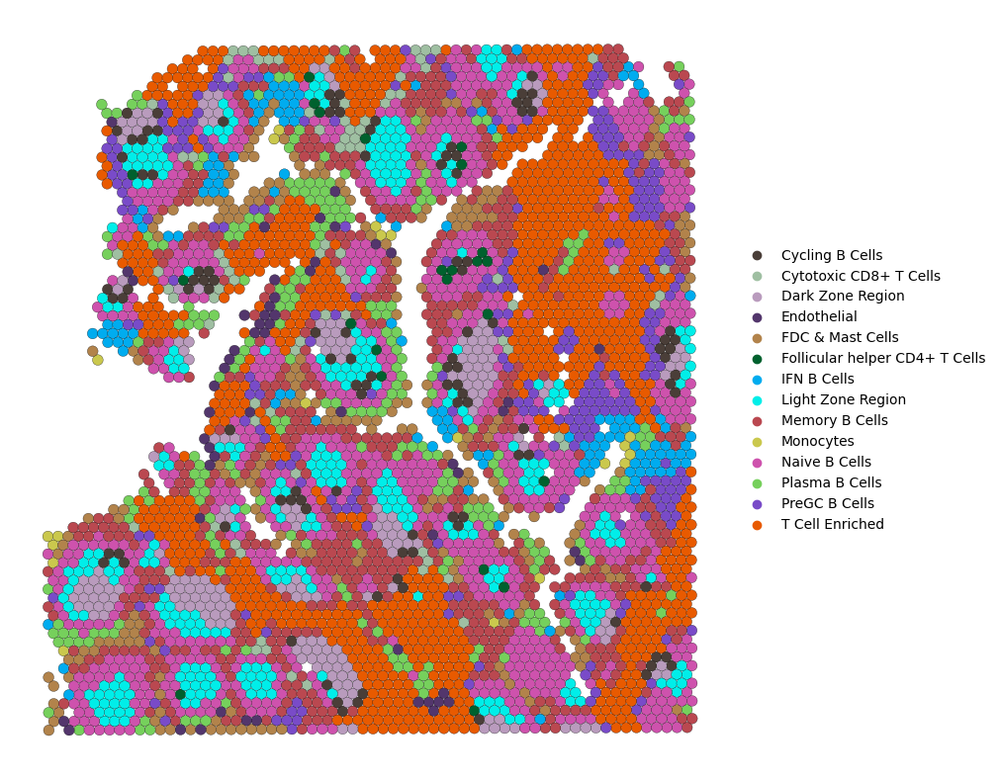

In [42]:
sq.pl.spatial_scatter(adata, color=['celltype'], size=size, title='',
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, palette=colors, img=False, shape='circle', 
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(10, 10), 
                      dpi=100)
plt.savefig('./figures/cell2location.svg', format='svg', dpi=180, transparent=True)
plt.show()